# **Image Classification for Mushroom Species**

## **Loading the Datasets**

### **Import TensorFlow and other libraries**

In [1]:
# Imports needed
import numpy as np
import PIL

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

### **Load in the dataset**

In [2]:
import pathlib
#dataset_directory = pathlib.Path("MushroomDatasets")
data_dir = pathlib.Path("./Mushrooms")

image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

6714


### **Some Examples of Images in the Dataset**

Agaricus

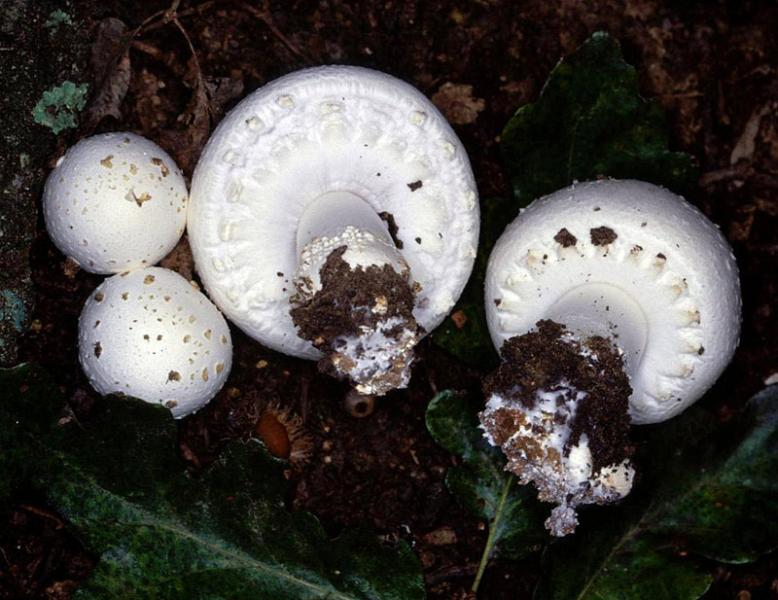

In [6]:
agaricus = list(data_dir.glob('Agaricus/*'))
PIL.Image.open(str(agaricus[0]))

Amanita

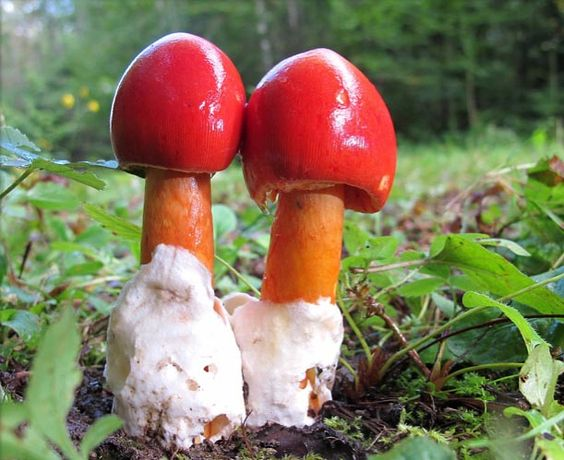

In [8]:
amanita = list(data_dir.glob('Amanita/*'))
PIL.Image.open(str(amanita[0]))

Suillus luteus (L.) Roussel:

In [ ]:
suillus_luteus = list(dataset_directory.glob('Suillus luteus (L.) Roussel/*'))
PIL.Image.open(str(suillus_luteus[0]))

## **Load Data Using a Keras Utility**

### **Creating the Dataset**

In [9]:
batch_size = 16
img_height = 224
img_width = 224

In [10]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    labels="inferred",
    label_mode="int",
    validation_split=0.2,
    subset="training",
    seed=123,
    shuffle="True",
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 6714 files belonging to 9 classes.
Using 5372 files for training.


In [11]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    labels="inferred",
    label_mode="int",
    validation_split=0.2,
    subset="validation",
    seed=123,
    shuffle="True",
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 6714 files belonging to 9 classes.
Using 1342 files for validation.


In [12]:
class_names = train_ds.class_names
print(class_names)

['Agaricus', 'Amanita', 'Boletus', 'Cortinarius', 'Entoloma', 'Hygrocybe', 'Lactarius', 'Russula', 'Suillus']


### **Visualize the Data**

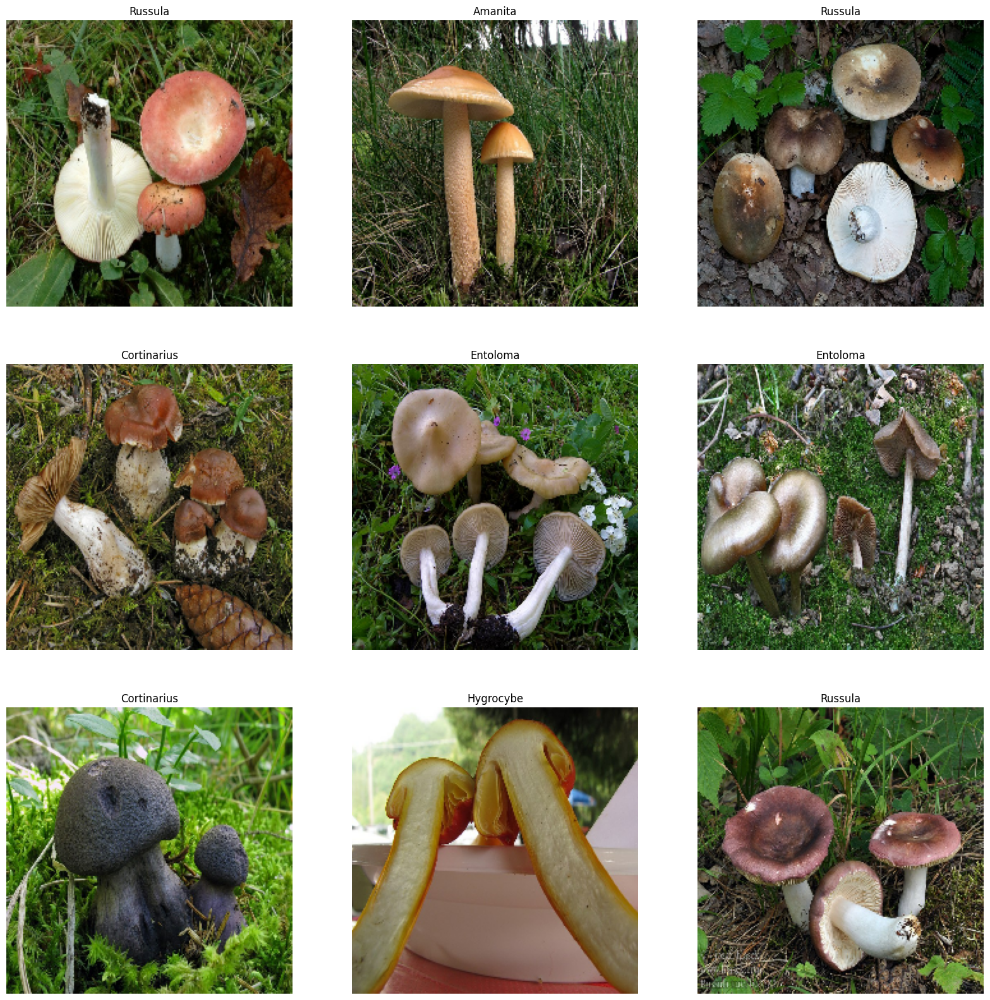

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [14]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(16, 224, 224, 3)
(16,)


### **Configuring the Dataset for Performance**

In [15]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### **Standardize the Data**

In [16]:
normalization_layer = layers.Rescaling(1./255)

In [19]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


### **Augment the Data**

In [17]:
data_augmentation = keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical",
                        input_shape=(img_height,
                                    img_width,
                                    3)),
        layers.RandomRotation(0.2),
        layers.RandomZoom(0.2),
    ])

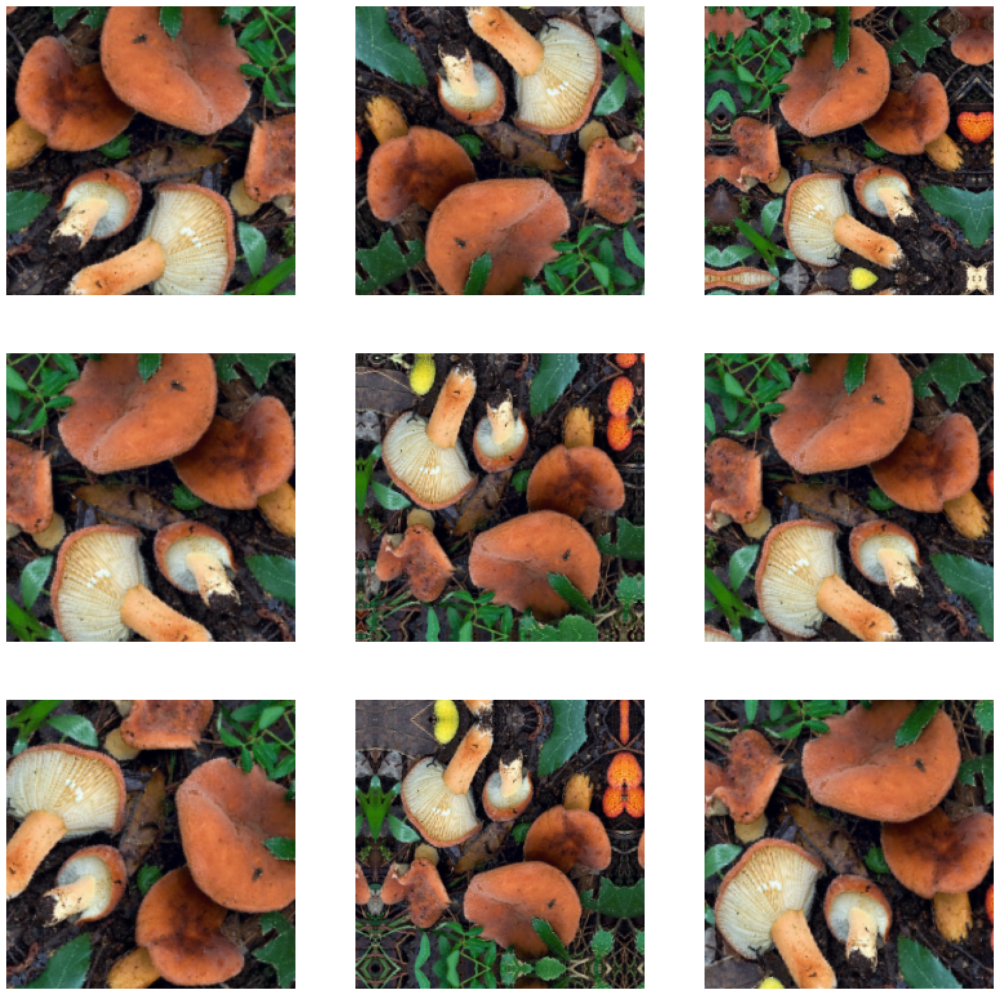

In [20]:
plt.figure(figsize=(20, 20))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

## **Training the Model**

### **Create the Model**

In [21]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

### **Compile the Model**

In [22]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

### **Model Summary**

In [23]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                 

### **Define the Callback**

In [24]:
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

checkpoint = ModelCheckpoint("Model.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq="epoch")
early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=40, verbose=1, mode='auto')
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1,
                              mode='max', cooldown=2, patience=2, min_lr=0)

### **Train the Model**

In [25]:
epochs = 20
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[checkpoint, early, reduce_lr],
)

Epoch 1/20


336/336 [==============================] - ETA: 0s - loss: 2.0123 - accuracy: 0.2386
Epoch 1: val_accuracy improved from -inf to 0.26677, saving model to Model.h5
336/336 [==============================] - 59s 172ms/step - loss: 2.0123 - accuracy: 0.2386 - val_loss: 1.9851 - val_accuracy: 0.2668 - lr: 1.0000e-04
Epoch 2/20


C:\Users\newuser\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


336/336 [==============================] - ETA: 0s - loss: 1.8989 - accuracy: 0.2823
Epoch 2: val_accuracy improved from 0.26677 to 0.30924, saving model to Model.h5
336/336 [==============================] - 56s 165ms/step - loss: 1.8989 - accuracy: 0.2823 - val_loss: 1.8672 - val_accuracy: 0.3092 - lr: 1.0000e-04
Epoch 3/20
336/336 [==============================] - ETA: 0s - loss: 1.8088 - accuracy: 0.3257
Epoch 3: val_accuracy improved from 0.30924 to 0.31967, saving model to Model.h5
336/336 [==============================] - 58s 171ms/step - loss: 1.8088 - accuracy: 0.3257 - val_loss: 1.8380 - val_accuracy: 0.3197 - lr: 1.0000e-04
Epoch 4/20
336/336 [==============================] - ETA: 0s - loss: 1.7542 - accuracy: 0.3559
Epoch 4: val_accuracy did not improve from 0.31967
336/336 [==============================] - 57s 169ms/step - loss: 1.7542 - accuracy: 0.3559 - val_loss: 1.9963 - val_accuracy: 0.2921 - lr: 1.0000e-04
Epoch 5/20
336/336 [==============================] - ETA

### **Visualize Training Results**

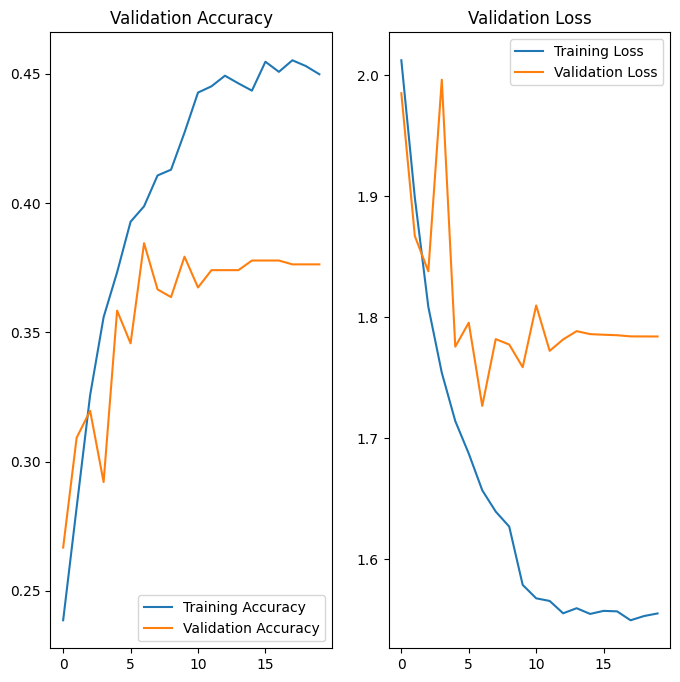

In [26]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training Accuracy')
plt.title('Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training Loss')
plt.title('Validation Loss')
plt.show()

## **Predict on New Data**

In [27]:
testing_directory = pathlib.Path("TestingDatasets")

testing_files = list(testing_directory.glob('*.jpg'))

for file in testing_files:
    image = tf.keras.preprocessing.image.load_img(file, target_size=(img_height, img_width))

    image_array = tf.keras.utils.img_to_array(image)
    image_array = tf.expand_dims(image_array, 0) # Create a batch

    predictions = model.predict(image_array)
    score = tf.nn.softmax(predictions[0])

    print(
        "This {} most likely belongs to {} with a {:.2f} percent confidence."
        .format(file, class_names[np.argmax(score)], 100 * np.max(score))
    ) 

In [28]:
model.export("mushroom classifier")

INFO:tensorflow:Assets written to: mushroom classifier\assets


INFO:tensorflow:Assets written to: mushroom classifier\assets


Saved artifact at 'mushroom classifier'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='sequential_input')
Output Type:
  TensorSpec(shape=(None, 9), dtype=tf.float32, name=None)
Captures:
  2265614842192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265614842768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265614842960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682996176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682998480: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682998096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682998288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682999440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682995216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682995408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2265682995024: TensorSpec(s

In [29]:
model.save("classifier")

INFO:tensorflow:Assets written to: classifier\assets


INFO:tensorflow:Assets written to: classifier\assets
